In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import image_utils
from tensorflow import keras
from keras.models import load_model

In [2]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [4]:
from skimage.color import rgb2hsv
from scipy.stats import mode

def is_predominantly_one_color(image, threshold=0.55):
    hsv_image = rgb2hsv(image)
    most_common_color = mode(hsv_image.reshape(-1, hsv_image.shape[-1]), axis=0).mode
    dominant_color_coverage = np.mean(np.all(hsv_image == most_common_color, axis=-1))
    return dominant_color_coverage > threshold

In [5]:
def filter_patches(lr_patches, hr_patches):
    filtered_lr_patches = []
    filtered_hr_patches = []

    for lr_patch, hr_patch in zip(lr_patches, hr_patches):
        if not is_predominantly_one_color(lr_patch) and not is_predominantly_one_color(hr_patch):
            filtered_lr_patches.append(lr_patch)
            filtered_hr_patches.append(hr_patch)

    return np.array(filtered_lr_patches), np.array(filtered_hr_patches)

In [11]:
# Load benchmarking data
dir_path = '/content/gdrive/MyDrive/super-res_project/Data'
val_lr_patches = np.load(os.path.join(dir_path,'val','lr_patches.npy'))
val_hr_patches = np.load(os.path.join(dir_path,'val','hr_patches.npy'))

bench_lr_patches = np.load(os.path.join(dir_path,'benchmark','lr_patches.npy'))
bench_hr_patches = np.load(os.path.join(dir_path,'benchmark','hr_patches.npy'))

test_lr_patches = np.load(os.path.join(dir_path,'test','lr_patches.npy'))
test_hr_patches = np.load(os.path.join(dir_path,'test','hr_patches.npy'))

val_dataset = tf.data.Dataset.from_tensor_slices((filter_patches(val_lr_patches, val_hr_patches)))
bench_dataset = tf.data.Dataset.from_tensor_slices((filter_patches(bench_lr_patches, bench_hr_patches)))
test_dataset = tf.data.Dataset.from_tensor_slices((filter_patches(test_lr_patches, test_hr_patches)))

In [7]:
from custom_loss import simplified_perceptual_loss
from custom_metrics import psnr_metric, ssim_metric

model = load_model('modelesrcnn8.h5', custom_objects={
    'psnr_metric': psnr_metric,
    'ssim_metric': ssim_metric,
    'simplified_perceptual_loss': simplified_perceptual_loss

})

In [8]:
# model.summary()

In [8]:
from skimage.metrics import peak_signal_noise_ratio as calculate_psnr
from skimage.metrics import structural_similarity as calculate_ssim

def get_psnr_ssim(dataset):
    """
    Returns average PSNR and SSIM across the dataset.
    """
    psnr_values = []
    ssim_values = []

    for batch in dataset:
        lr_images, hr_images = batch
        sr_images = model.predict(lr_images)  # Obtain super-resolved images

        for sr_img, hr_img in zip(sr_images, hr_images):
            sr_img = np.array(sr_img).astype(np.float32)
            hr_img = np.array(hr_img).astype(np.float32)

            # Calculate PSNR and SSIM for each pair in the batch
            psnr = calculate_psnr(hr_img, sr_img)
            ssim = calculate_ssim(hr_img, sr_img, channel_axis=-1)
            psnr_values.append(psnr)
            ssim_values.append(ssim)

    # Avg PSNR, SSIM across all batches
    avg_psnr = np.mean(psnr_values)
    avg_ssim = np.mean(ssim_values)

    return avg_psnr, avg_ssim, psnr_values, ssim_values


In [12]:
val_dataset = val_dataset.batch(32)
bench_dataset = bench_dataset.batch(32)
test_dataset = test_dataset.batch(32)

In [13]:
val_avg_psnr, val_avg_ssim, val_psnr, val_ssim = get_psnr_ssim(val_dataset)
bench_avg_psnr, bench_avg_ssim, bench_psnr, bench_ssim = get_psnr_ssim(bench_dataset)
test_avg_psnr, test_avg_ssim, test_psnr, test_ssim = get_psnr_ssim(test_dataset)
print(f"Set1: Average PSNR: {val_avg_psnr}, Average SSIM: {val_avg_ssim}")
print(f"Set2: Average PSNR: {bench_avg_psnr}, Average SSIM: {bench_avg_ssim}")
print(f"Set3: Average PSNR: {test_avg_psnr}, Average SSIM: {test_avg_ssim}")

1/1 [==============================] - 1s 552ms/step
Set1: Average PSNR: 26.40090173056067, Average SSIM: 0.8656101226806641
Set2: Average PSNR: 23.73643356698779, Average SSIM: 0.8063997626304626
Set3: Average PSNR: 25.24725765302283, Average SSIM: 0.8425975441932678


In [14]:
results = model.evaluate(val_dataset)
print(f"Validation Loss: {results[0]}")
for i, metric in enumerate(model.metrics_names[1:], 1):
    print(f"Validation {metric}: {results[i]}")

4/4 [==============================] - 57s 13s/step - loss: 2.1082 - psnr_metric: 26.4009 - ssim_metric: 0.7908
Validation Loss: 2.108175039291382
Validation psnr_metric: 26.400901794433594
Validation ssim_metric: 0.7908216118812561


In [15]:
results = model.evaluate(bench_dataset)
print(f"Validation Loss: {results[0]}")
for i, metric in enumerate(model.metrics_names[1:], 1):
    print(f"Validation {metric}: {results[i]}")

10/10 [==============================] - 132s 13s/step - loss: 3.7380 - psnr_metric: 23.7364 - ssim_metric: 0.7148
Validation Loss: 3.7380101680755615
Validation psnr_metric: 23.736433029174805
Validation ssim_metric: 0.7147986888885498


In [16]:
results = model.evaluate(test_dataset)
print(f"Validation Loss: {results[0]}")
for i, metric in enumerate(model.metrics_names[1:], 1):
    print(f"Validation {metric}: {results[i]}")

5/5 [==============================] - 40s 8s/step - loss: 3.0828 - psnr_metric: 25.2473 - ssim_metric: 0.7749
Validation Loss: 3.082768678665161
Validation psnr_metric: 25.247255325317383
Validation ssim_metric: 0.7748819589614868


In [17]:
unbatched_val_dataset = val_dataset.unbatch()
unbatched_bench_dataset = bench_dataset.unbatch()
unbatched_test_dataset = test_dataset.unbatch()

In [18]:
def plot_image_triplets(image_pairs, model, title):
    plt.figure(figsize=(15, num_examples * 5))

    for i, (pair, psnr, ssim) in enumerate(image_pairs):
        lr_image, hr_image = pair
        # Generate the SR image
        sr_image = model.predict(tf.expand_dims(lr_image, axis=0))[0]

        # Plot LR image
        plt.subplot(len(image_pairs), 3, i * 3 + 1)
        plt.imshow(lr_image)
        plt.title("LR Image")
        plt.axis('off')

        # Plot SR image
        plt.subplot(len(image_pairs), 3, i * 3 + 2)
        plt.imshow(sr_image)
        print(sr_image.shape)
        plt.title(f"SR Image\nPSNR: {psnr:.2f}, SSIM: {ssim:.2f}")
        plt.axis('off')

        # Plot HR image
        plt.subplot(len(image_pairs), 3, i * 3 + 3)
        plt.imshow(hr_image)
        plt.title("HR Image")
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

1/1 [==============================] - 0s 61ms/step
(128, 128, 3)
1/1 [==============================] - 0s 49ms/step
(128, 128, 3)
1/1 [==============================] - 0s 41ms/step


(128, 128, 3)
1/1 [==============================] - 0s 51ms/step
(128, 128, 3)
1/1 [==============================] - 0s 41ms/step
(128, 128, 3)


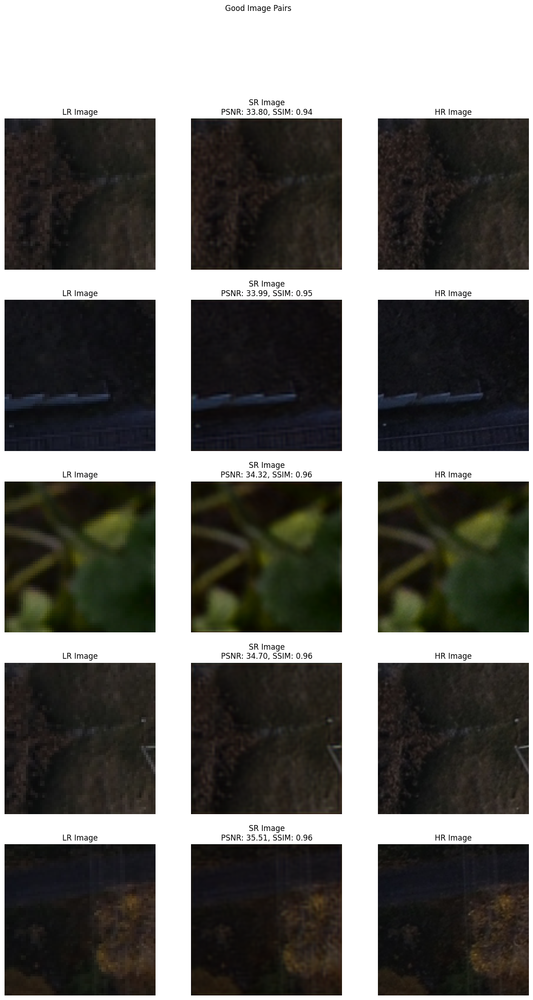

1/1 [==============================] - 0s 69ms/step
(128, 128, 3)
1/1 [==============================] - 0s 72ms/step


(128, 128, 3)
1/1 [==============================] - 0s 73ms/step
(128, 128, 3)
1/1 [==============================] - 0s 40ms/step
(128, 128, 3)
1/1 [==============================] - 0s 42ms/step
(128, 128, 3)


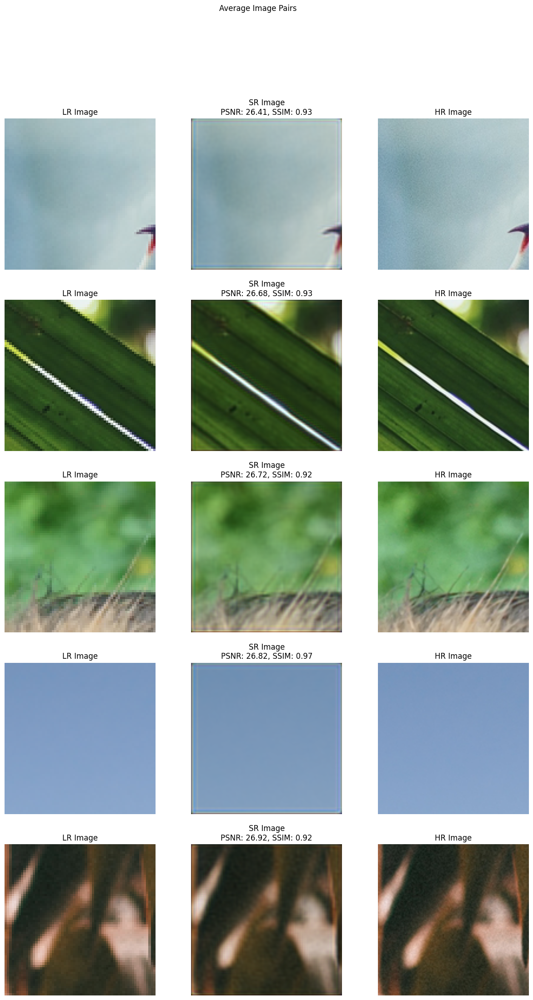

1/1 [==============================] - 0s 80ms/step


(128, 128, 3)
1/1 [==============================] - 0s 113ms/step


(128, 128, 3)
1/1 [==============================] - 0s 160ms/step


(128, 128, 3)
1/1 [==============================] - 0s 180ms/step


(128, 128, 3)
1/1 [==============================] - 0s 185ms/step


(128, 128, 3)


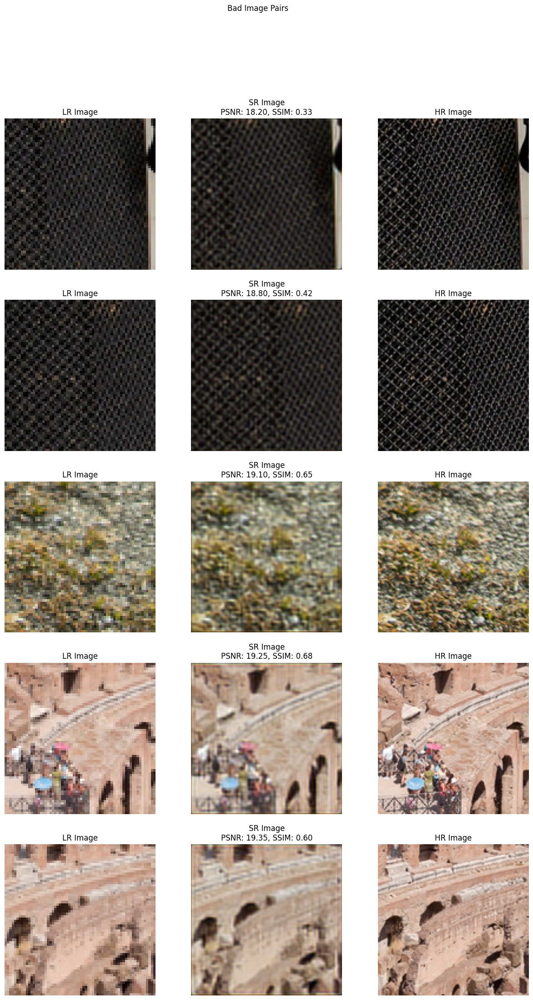

In [19]:
image_pairs = list(zip(unbatched_val_dataset, val_psnr, val_ssim))
num_examples = 5
# Sort the image pairs by PSNR
image_pairs.sort(key=lambda x: x[1])

# Get the top 'num_examples' image pairs with the highest PSNR (Good)
good_image_pairs = image_pairs[-num_examples:]

# Selecting 'num_examples' image pairs from the middle (Average)
mid_index = len(image_pairs) // 2
average_image_pairs = image_pairs[mid_index - num_examples//2 : mid_index + num_examples//2 + 1]

# Get the first 'num_examples' image pairs with the lowest PSNR (Bad)
bad_image_pairs = image_pairs[:num_examples]

plot_image_triplets(good_image_pairs, model, "Good Image Pairs")
plot_image_triplets(average_image_pairs, model, "Average Image Pairs")
plot_image_triplets(bad_image_pairs, model, "Bad Image Pairs")

1/1 [==============================] - 0s 53ms/step
(128, 128, 3)
1/1 [==============================] - 0s 59ms/step


(128, 128, 3)
1/1 [==============================] - 0s 75ms/step


(128, 128, 3)
1/1 [==============================] - 0s 77ms/step


(128, 128, 3)
1/1 [==============================] - 0s 74ms/step


(128, 128, 3)


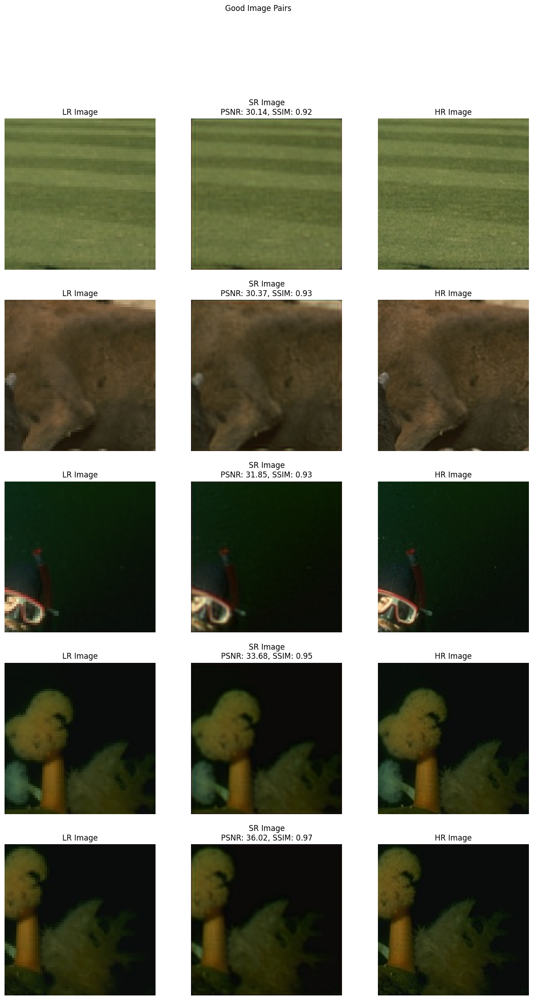

1/1 [==============================] - 0s 70ms/step


(128, 128, 3)
1/1 [==============================] - 0s 109ms/step
(128, 128, 3)
1/1 [==============================] - 0s 88ms/step
(128, 128, 3)
1/1 [==============================] - 0s 77ms/step


(128, 128, 3)
1/1 [==============================] - 0s 87ms/step


(128, 128, 3)


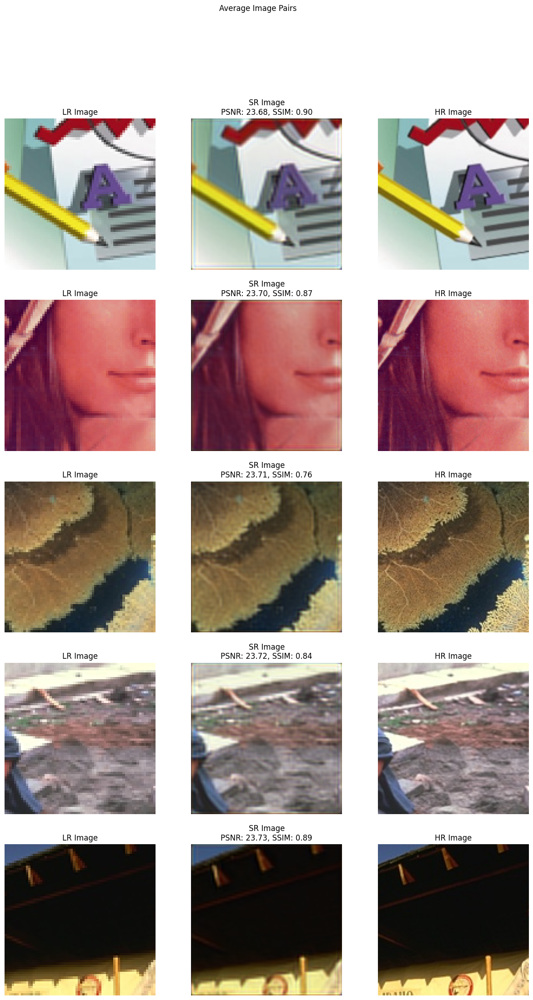

1/1 [==============================] - 0s 77ms/step


(128, 128, 3)
1/1 [==============================] - 0s 101ms/step


(128, 128, 3)
1/1 [==============================] - 0s 90ms/step


(128, 128, 3)
1/1 [==============================] - 0s 78ms/step


(128, 128, 3)
1/1 [==============================] - 0s 73ms/step


(128, 128, 3)


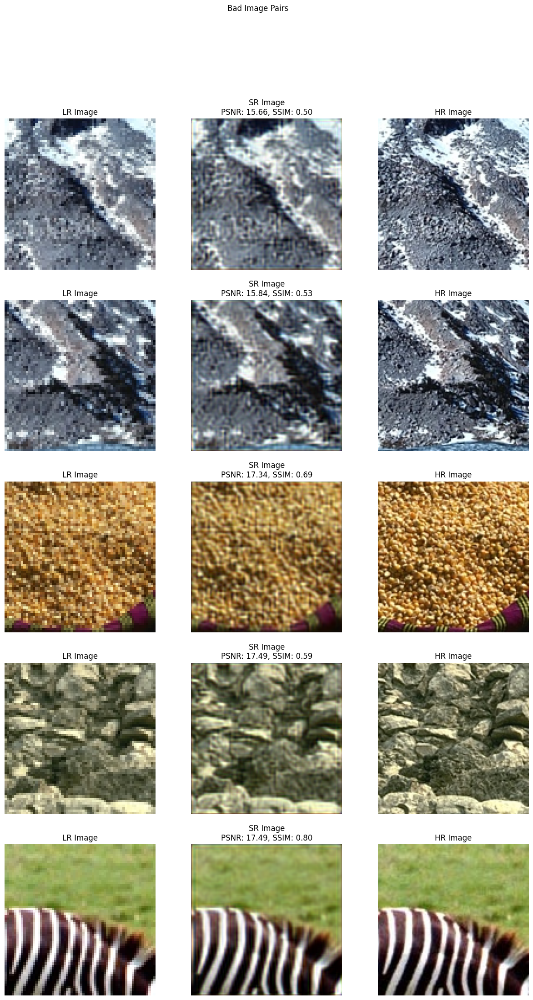

In [20]:
image_pairs = list(zip(unbatched_bench_dataset, bench_psnr, bench_ssim))
image_pairs.sort(key=lambda x: x[1])
good_image_pairs = image_pairs[-num_examples:]
mid_index = len(image_pairs) // 2
average_image_pairs = image_pairs[mid_index - num_examples//2 : mid_index + num_examples//2 + 1]
bad_image_pairs = image_pairs[:num_examples]

plot_image_triplets(good_image_pairs, model, "Good Image Pairs")
plot_image_triplets(average_image_pairs, model, "Average Image Pairs")
plot_image_triplets(bad_image_pairs, model, "Bad Image Pairs")

1/1 [==============================] - 0s 44ms/step
(128, 128, 3)
1/1 [==============================] - 0s 43ms/step
(128, 128, 3)
1/1 [==============================] - 0s 44ms/step
(128, 128, 3)
1/1 [==============================] - 0s 48ms/step
(128, 128, 3)
1/1 [==============================] - 0s 45ms/step
(128, 128, 3)


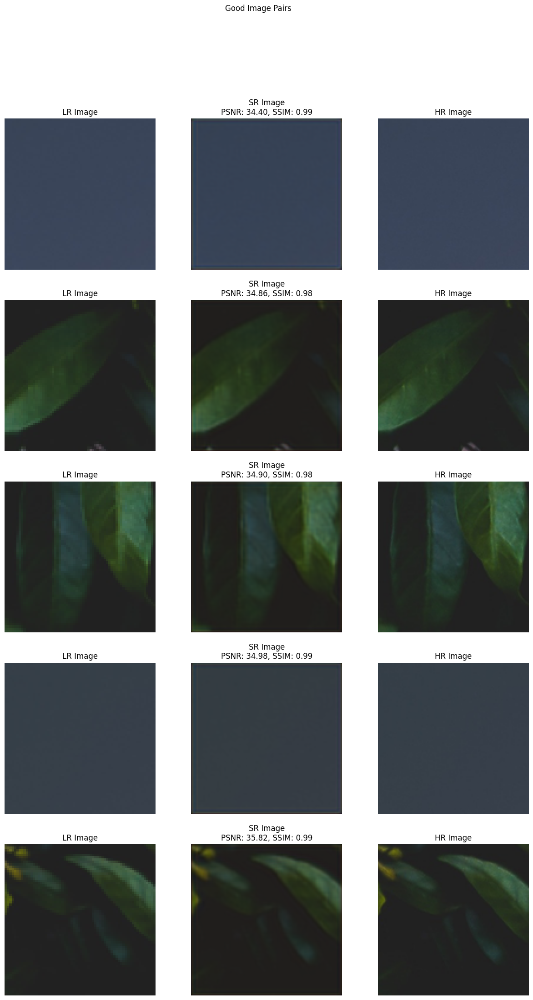

1/1 [==============================] - 0s 78ms/step


(128, 128, 3)
1/1 [==============================] - 0s 56ms/step
(128, 128, 3)
1/1 [==============================] - 0s 49ms/step
(128, 128, 3)
1/1 [==============================] - 0s 55ms/step


(128, 128, 3)
1/1 [==============================] - 0s 43ms/step


(128, 128, 3)


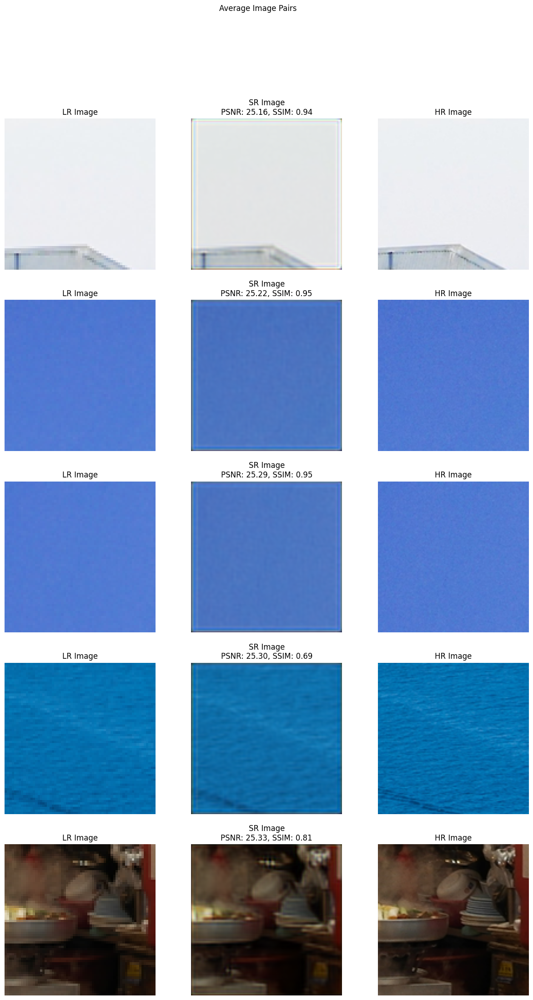

1/1 [==============================] - 0s 145ms/step


(128, 128, 3)
1/1 [==============================] - 0s 131ms/step


(128, 128, 3)
1/1 [==============================] - 0s 95ms/step


(128, 128, 3)
1/1 [==============================] - 0s 95ms/step


(128, 128, 3)
1/1 [==============================] - 0s 119ms/step


(128, 128, 3)


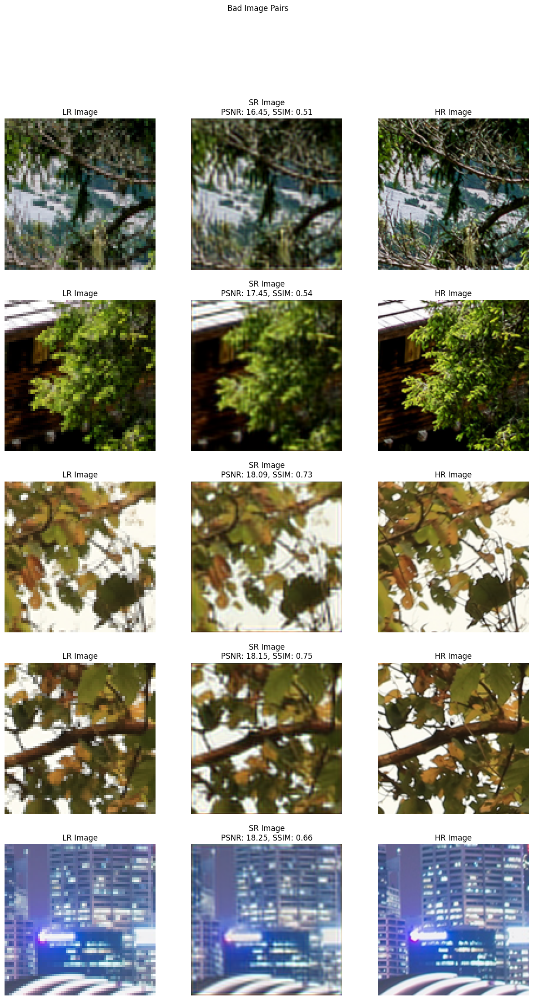

In [21]:
image_pairs = list(zip(unbatched_test_dataset, test_psnr, test_ssim))
image_pairs.sort(key=lambda x: x[1])
good_image_pairs = image_pairs[-num_examples:]
mid_index = len(image_pairs) // 2
average_image_pairs = image_pairs[mid_index - num_examples//2 : mid_index + num_examples//2 + 1]
bad_image_pairs = image_pairs[:num_examples]

plot_image_triplets(good_image_pairs, model, "Good Image Pairs")
plot_image_triplets(average_image_pairs, model, "Average Image Pairs")
plot_image_triplets(bad_image_pairs, model, "Bad Image Pairs")

In [ ]:
# !pip install lpips

In [ ]:
# bench_dataset = unbatched_bench_dataset.batch(32)
# for batch in bench_dataset.take(1):  # Take one batch from the dataset
#     lr_images_batch, hr_images_batch = batch
#     print("LR Image batch shape:", lr_images_batch.shape)  # [batch_size, height, width, channels]
#     print("HR Image batch shape:", hr_images_batch.shape)  # [batch_size, height, width, channels]

#     # Check the number of channels
#     lr_channels = lr_images_batch.shape[-1]
#     hr_channels = hr_images_batch.shape[-1]
#     print("LR Image channels:", lr_channels)
#     print("HR Image channels:", hr_channels)

In [ ]:
# import lpips
# import torch

In [ ]:
# # Use .cuda() for GPU acceleration
# lpips_model = lpips.LPIPS(net='vgg')

# def to_torch(input_data):
#     if isinstance(input_data, tf.Tensor):
#         input_data = input_data.numpy()

#     input_data_torch = torch.from_numpy(input_data).unsqueeze(0).permute(0, 3, 1, 2).float().div(255.)
#     return input_data_torch

# lpips_scores = []

# for batch in bench_dataset:
#     lr_images_batch, hr_images_batch = batch
#     sr_images_batch = model.predict(lr_images_batch)

#     # Convert and calculate LPIPS for each pair in the batch
#     for hr_image, sr_image in zip(hr_images_batch, sr_images_batch):
#         torch_hr_image = to_torch(hr_image)
#         torch_sr_image = to_torch(sr_image)

#         # Calculate LPIPS for the current pair
#         lpips_score = lpips_model(torch_hr_image, torch_sr_image).mean().item()
#         lpips_scores.append(lpips_score)

# average_lpips_score = np.mean(lpips_scores)
# print("Average LPIPS:", average_lpips_score)
